SPATIAL DOMAIN

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import data, exposure, color

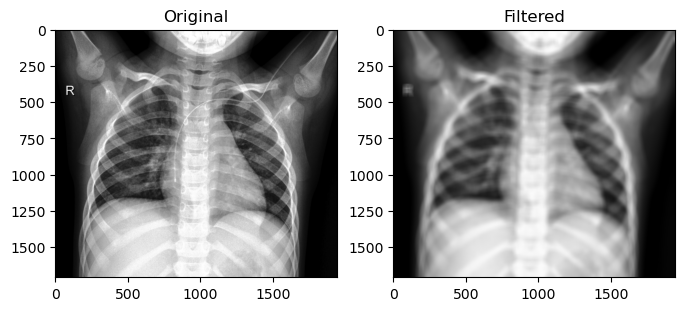

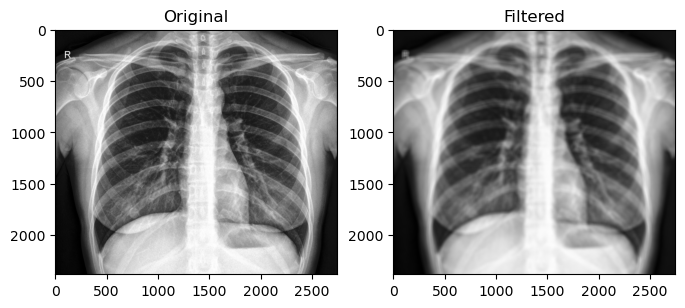

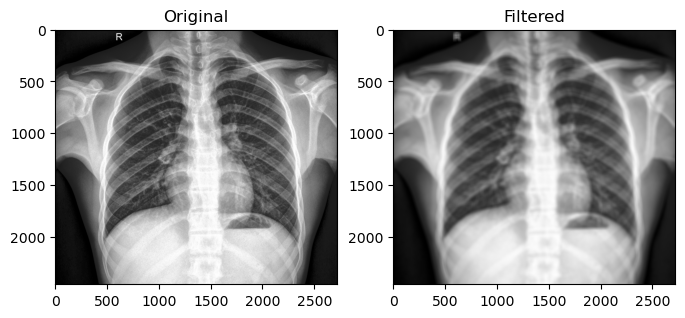

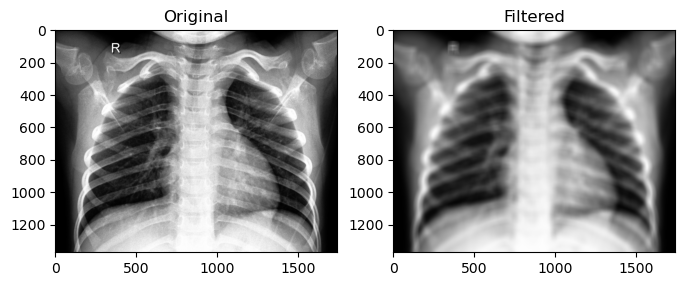

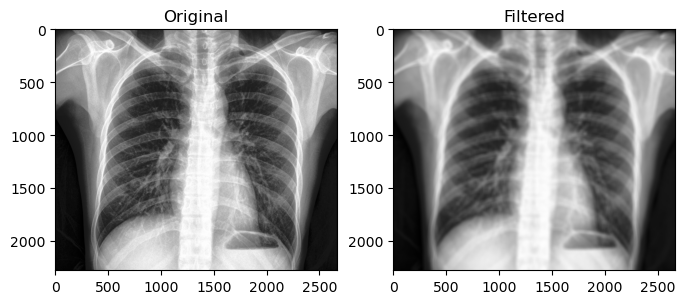

In [2]:
#SPATIAL AVERAGING FILTER
def apply_spatial_averaging_filter(image, kernel_size):
    # Create a kernel for spatial averaging
    kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size * kernel_size)

    # Apply the filter using OpenCV's filter2D function
    filtered_image = cv2.filter2D(image, -1, kernel)

    # Display the original and filtered images
    filtered_image = np.abs(filtered_image)
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(filtered_image, cmap='gray'), plt.title('Filtered')
    plt.show()

# Load the input image
image1=cv2.imread('01.jpeg',1)
image2=cv2.imread('02.jpeg',1)
image3=cv2.imread('03.jpeg',1)
image4=cv2.imread('04.jpeg',1)
image5=cv2.imread('05.jpeg',1)
# Apply spatial averaging filter with a kernel size of 40x40
apply_spatial_averaging_filter(image1, kernel_size=35)
apply_spatial_averaging_filter(image2, kernel_size=35)
apply_spatial_averaging_filter(image3, kernel_size=35)
apply_spatial_averaging_filter(image4, kernel_size=35)
apply_spatial_averaging_filter(image5, kernel_size=35)

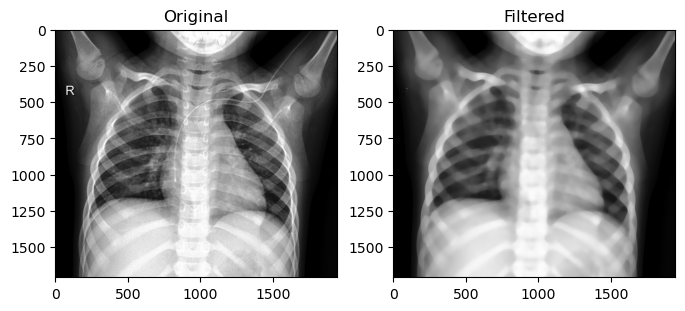

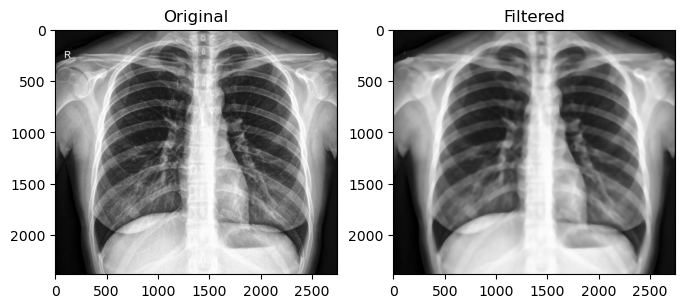

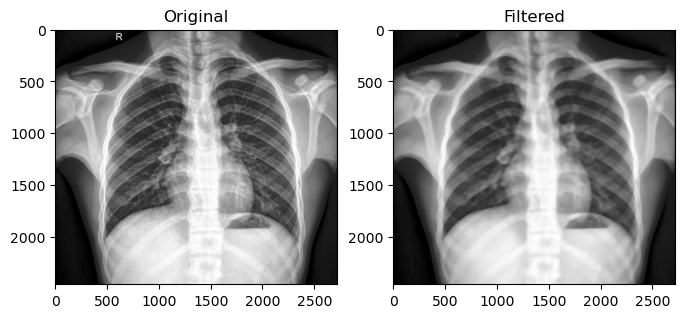

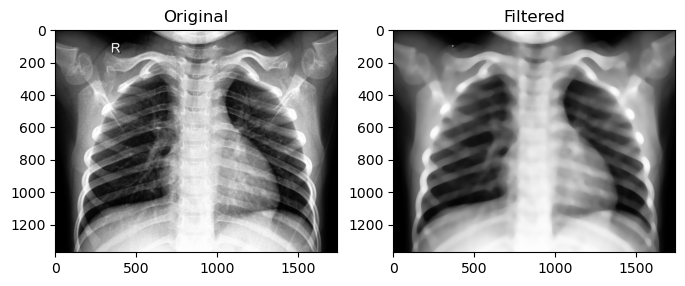

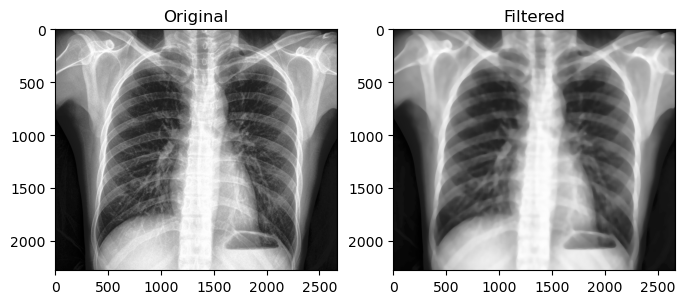

In [3]:
#Median Filter

def apply_median_filter(image):
    
    # Apply median filter
    filtered_image = cv2.medianBlur(image, 35)  # Change the kernel size as needed
    
    filtered_image = np.abs(filtered_image)
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(filtered_image, cmap='gray'), plt.title('Filtered')
    plt.show()
    return filtered_image


image6=apply_median_filter(image1)
image7=apply_median_filter(image2)
image8=apply_median_filter(image3)
image9=apply_median_filter(image4)
image10=apply_median_filter(image5)




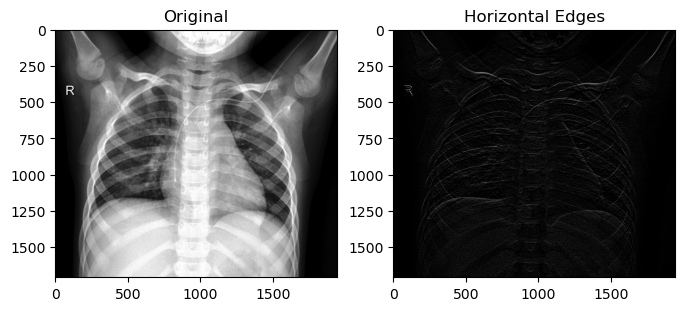

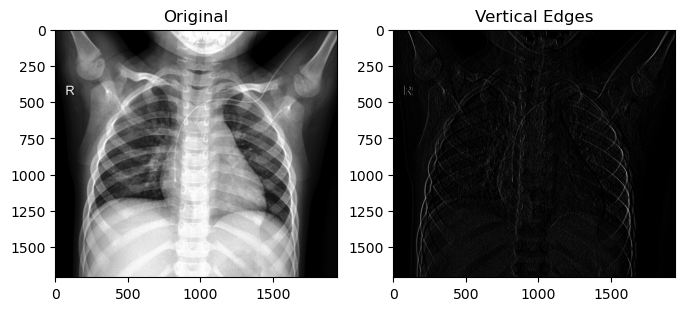

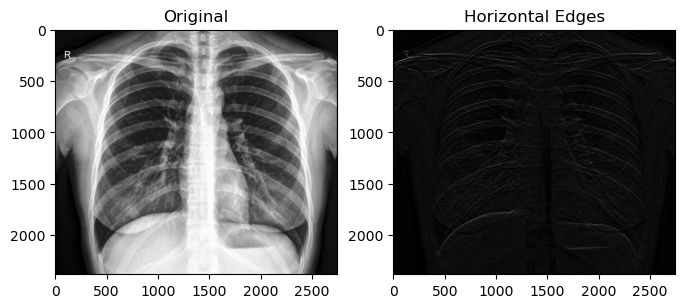

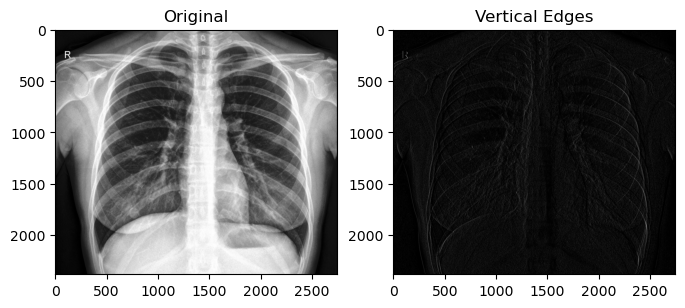

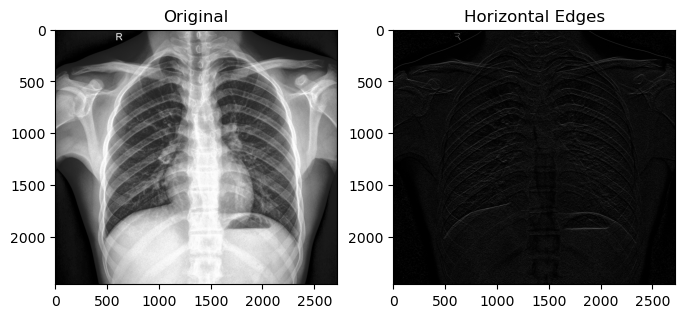

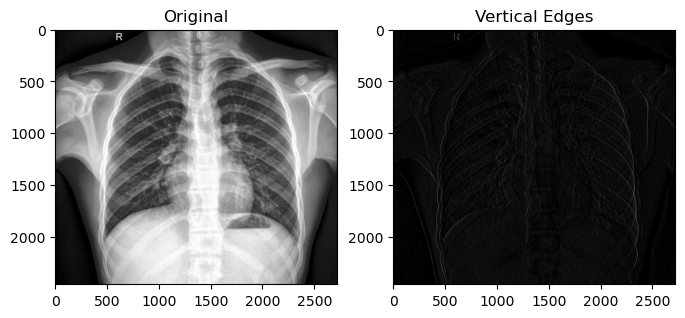

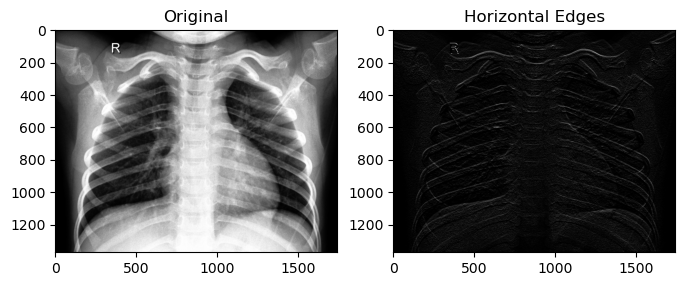

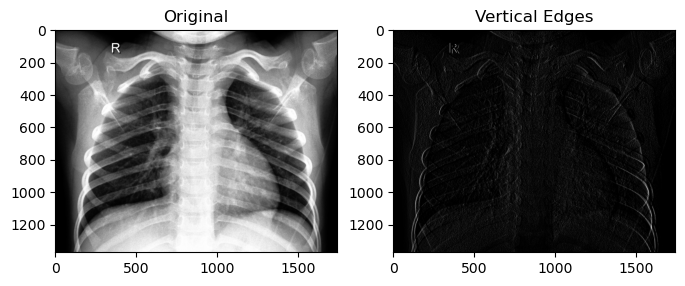

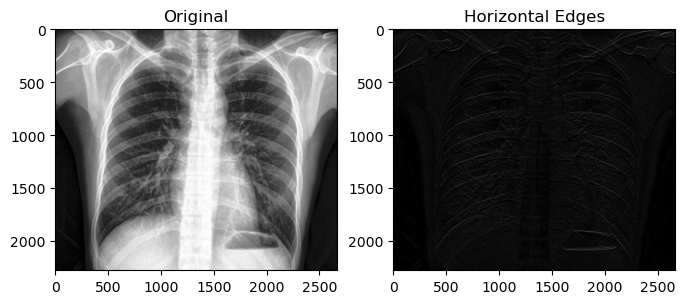

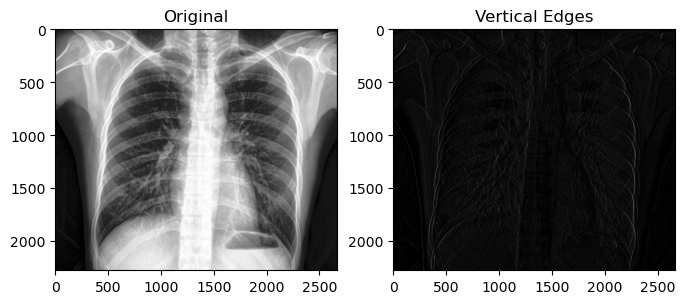

In [4]:
#SOBEL OPERATORS

def sobel(image):

    kernel_x = np.array([[-1,-2,-1], [0,0,0],[1,2,1]])
    kernel_y = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])

    gradient_x = cv2.filter2D(image, -1, kernel_x)
    gradient_y = cv2.filter2D(image, -1, kernel_y)

    # Display the original image and the edges
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(gradient_x, cmap='gray'), plt.title('Horizontal Edges')
    plt.show()
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(gradient_y, cmap='gray'), plt.title('Vertical Edges')
    plt.show()

sobel(image1)
sobel(image2)
sobel(image3)
sobel(image4)
sobel(image5)

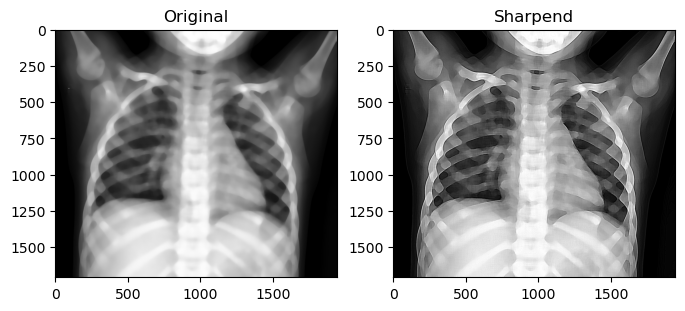

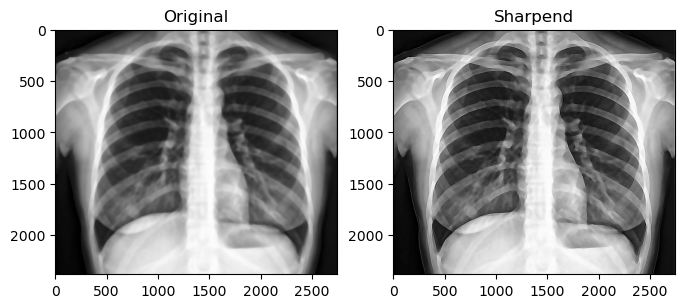

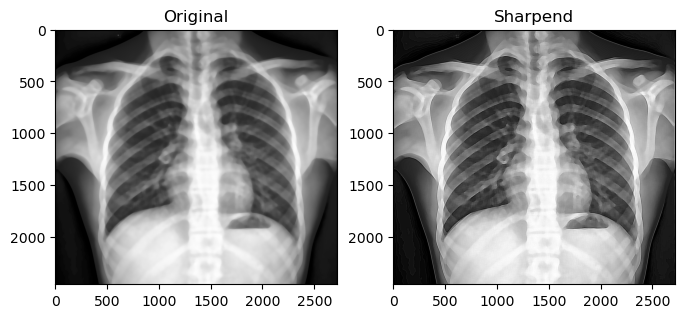

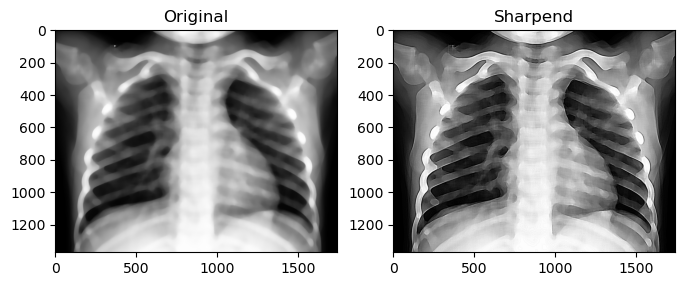

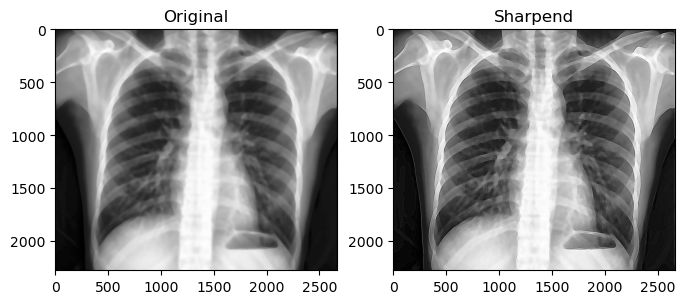

In [5]:
#Laplacian
# Define the sharpening kernel
kernel = np.array([
    [-1, -1, -1, -1, -1, -1, -1],
    [-1, -1, -1, -1, -1, -1, -1],
    [-1, -1, -1, -1, -1, -1, -1],
    [-1, -1, -1, 50, -1, -1, -1],
    [-1, -1, -1, -1, -1, -1, -1],
    [-1, -1, -1, -1, -1, -1, -1],
    [-1, -1, -1, -1, -1, -1, -1]
])

# Normalize the kernel
kernel = kernel / np.sum(kernel)

def laplacianfilter(image,kernel):
    sharpened_image = cv2.filter2D(image, -1, kernel)
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(sharpened_image, cmap='gray'), plt.title('Sharpend')
    plt.show()
    
laplacianfilter(image6,kernel)
laplacianfilter(image7,kernel)
laplacianfilter(image8,kernel)
laplacianfilter(image9,kernel)
laplacianfilter(image10,kernel)

FREQUENCY DOMAIN

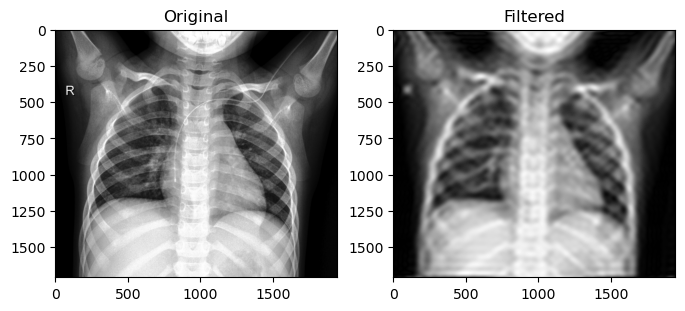

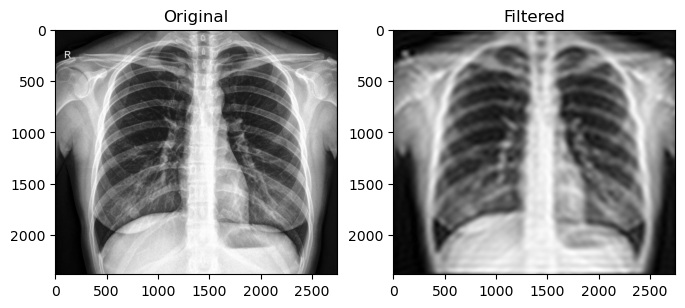

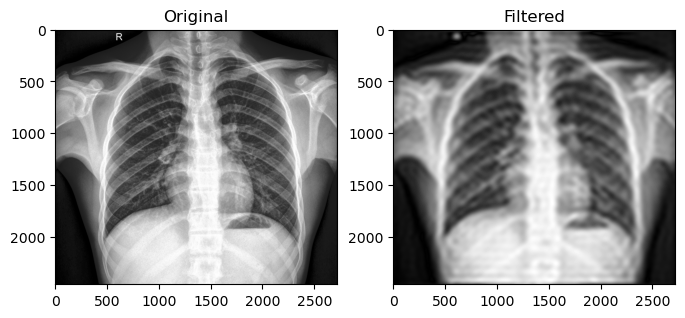

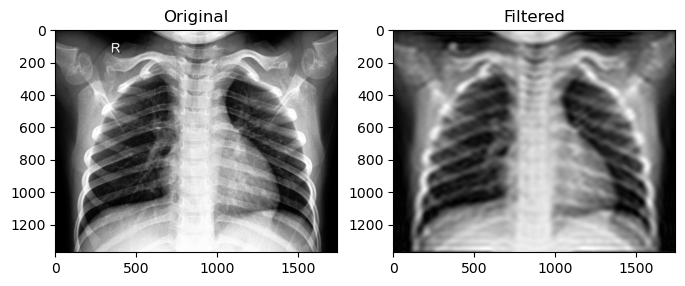

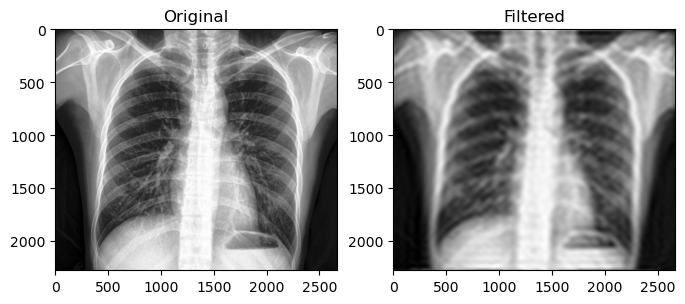

In [6]:
#IDEAL LOW PASS FILTER

def ideal_low_pass_filter(image, cutoff_frequency):
    # Convert the image to grayscale if necessary
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Perform the FFT
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    # Get the center coordinates of the image
    rows, cols = image.shape
    center_row = rows // 2
    center_col = cols // 2

    # Create a mask for the ideal low pass filter
    mask = np.zeros((rows, cols), dtype=np.uint8)
    mask[center_row - cutoff_frequency:center_row + cutoff_frequency,
         center_col - cutoff_frequency:center_col + cutoff_frequency] = 1

    # Apply the mask to the frequency domain
    fshift_filtered = fshift * mask

    # Perform the inverse FFT
    f_filtered = np.fft.ifftshift(fshift_filtered)
    filtered_image = np.fft.ifft2(f_filtered)
    filtered_image = np.abs(filtered_image)
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(filtered_image, cmap='gray'), plt.title('Filtered')
    plt.show()

cutoff_frequency = 30

# Apply the ideal low pass filter
ideal_low_pass_filter(image1, cutoff_frequency)
ideal_low_pass_filter(image2, cutoff_frequency)
ideal_low_pass_filter(image3, cutoff_frequency)
ideal_low_pass_filter(image4, cutoff_frequency)
ideal_low_pass_filter(image5, cutoff_frequency)




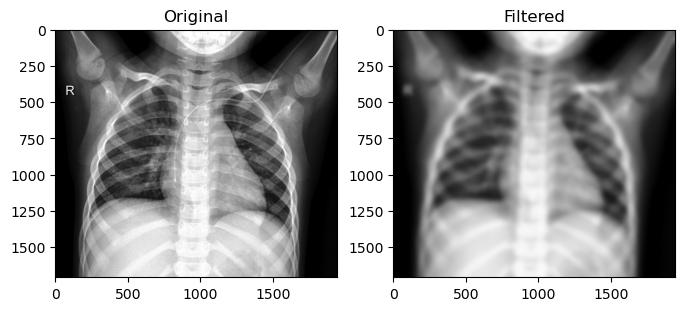

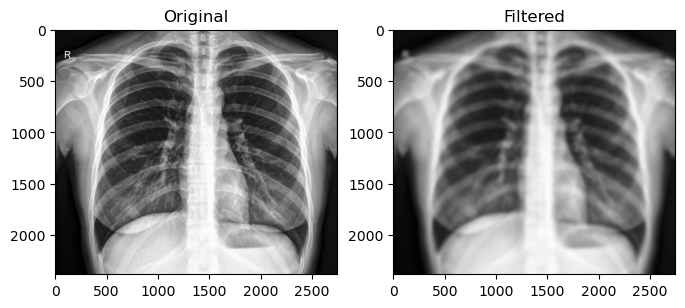

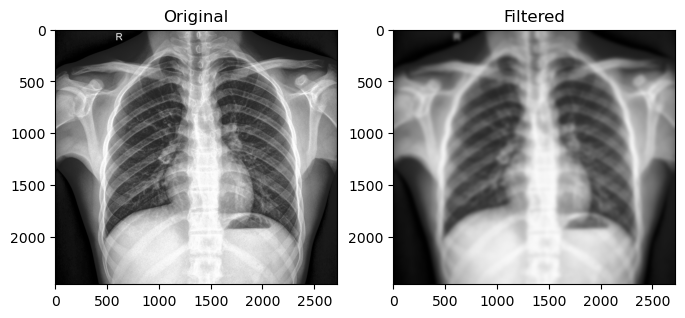

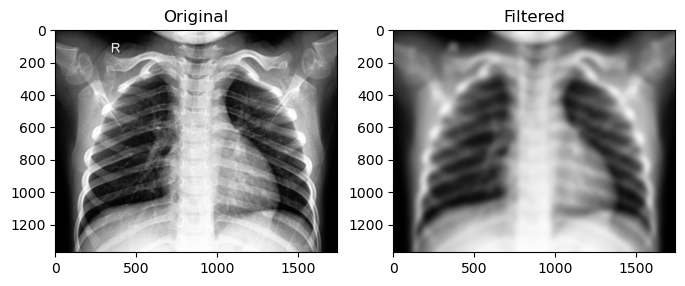

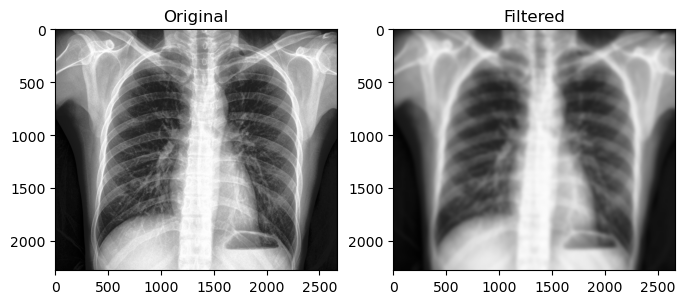

In [7]:
#GAUSSIAN LOW PASS FILTER

def gaussian_low_pass_filter(image, sigma):
    # Convert the image to float32 for calculations
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    image = np.float32(image)
    
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(image, (0, 0), sigma)
    
    # Convert the blurred image back to uint8
    filtered = np.uint8(blurred)


    plt.subplot(122), plt.imshow(filtered, cmap='gray'), plt.title('Filtered')
    plt.show()
sigma=15
gaussian_low_pass_filter(image1, sigma)
gaussian_low_pass_filter(image2, sigma)
gaussian_low_pass_filter(image3, sigma)
gaussian_low_pass_filter(image4, sigma)
gaussian_low_pass_filter(image5, sigma)

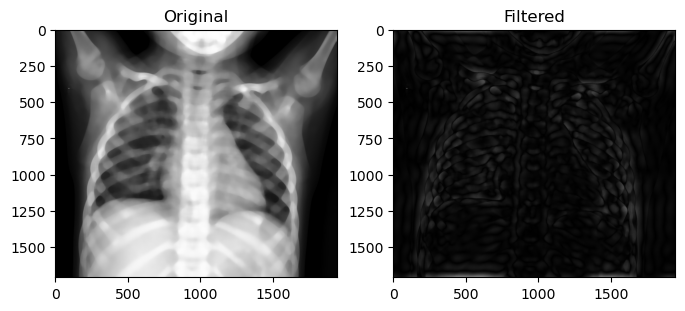

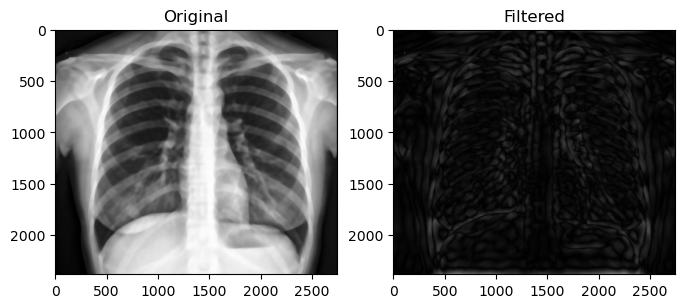

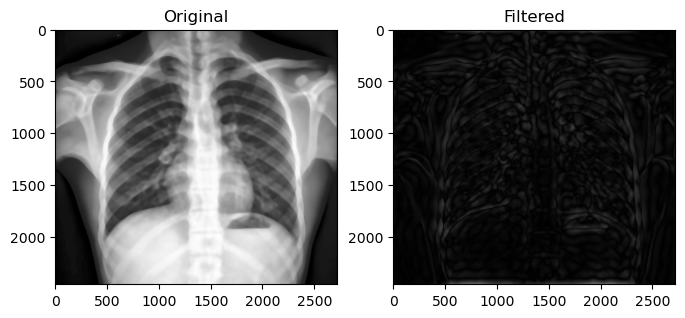

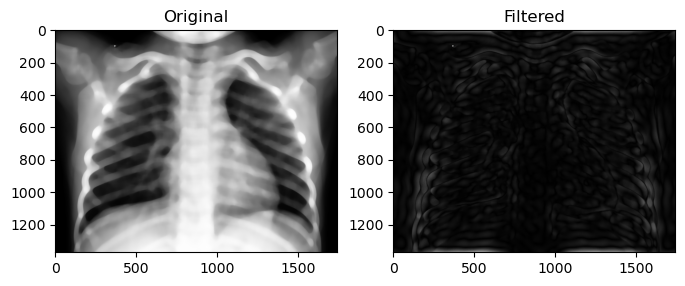

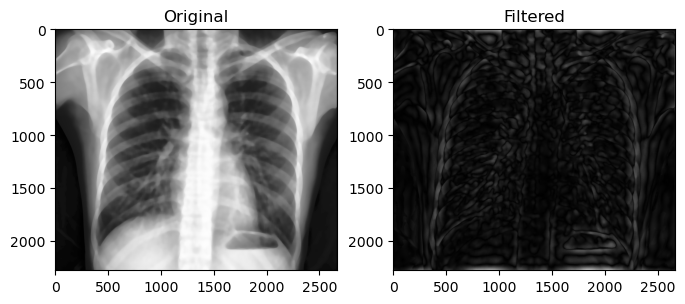

In [8]:
#IDEAL HIGH PASS FILTER

def high_pass_filter(image, cutoff_frequency):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Perform Discrete Fourier Transform
    dft = cv2.dft(np.float32(gray), flags=cv2.DFT_COMPLEX_OUTPUT)

    # Shift the zero-frequency component to the center of the spectrum
    dft_shift = np.fft.fftshift(dft)

    # Compute the magnitude spectrum
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    # Create a high-pass filter mask
    rows, cols = gray.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.ones((rows, cols, 2), np.uint8)
    mask[center_row - cutoff_frequency:center_row + cutoff_frequency,
         center_col - cutoff_frequency:center_col + cutoff_frequency] = 0

    # Apply the high-pass filter by multiplying the mask with the Fourier transformed image
    filtered_shift = dft_shift * mask

    # Shift the zero-frequency component back to the corner
    filtered = np.fft.ifftshift(filtered_shift)

    # Perform inverse Discrete Fourier Transform
    filtered_image = cv2.idft(filtered)
    filtered_image = cv2.magnitude(filtered_image[:, :, 0], filtered_image[:, :, 1])

    # Normalize the filtered image to the range [0, 255]
    filtered_image = cv2.normalize(filtered_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(filtered_image, cmap='gray'), plt.title('Filtered')
    plt.show()


# Load the input image
input_image = cv2.imread('input_image.jpg')

# Set the cutoff frequency for the high-pass filter
cutoff_frequency = 13  # Adjust this value as per your requirement

# Apply the high-pass filter
high_pass_filter(image6, cutoff_frequency)
high_pass_filter(image7, cutoff_frequency)
high_pass_filter(image8, cutoff_frequency)
high_pass_filter(image9, cutoff_frequency)
high_pass_filter(image10, cutoff_frequency)

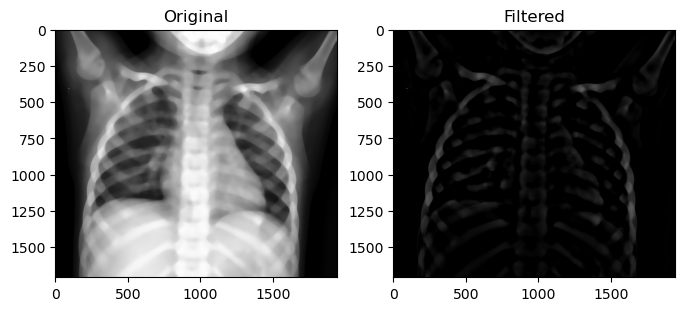

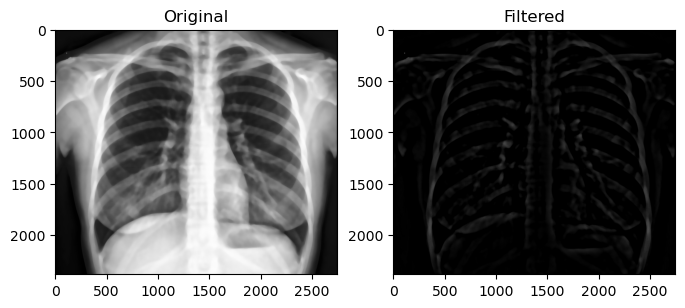

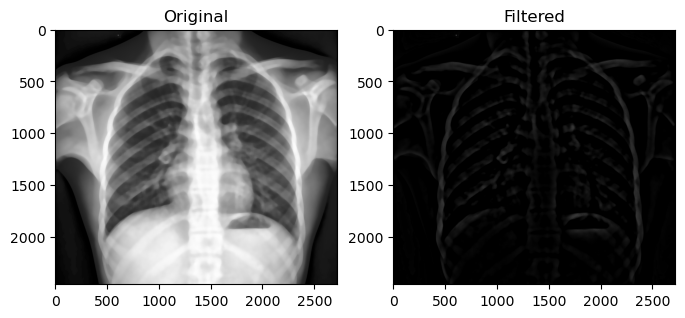

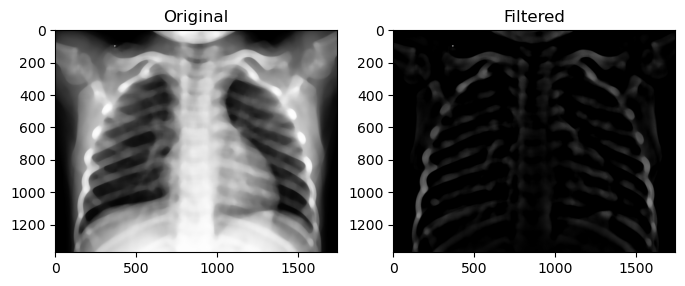

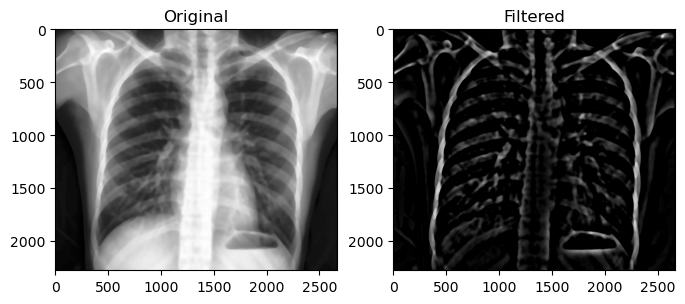

In [9]:
#GAUSSIAN HIGH PASS FILTER
def gaussian_high_pass_filter(image, sigma):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply Gaussian blur
    blurred_image = cv2.GaussianBlur(gray_image, (0, 0), sigma)
    
    # Subtract the blurred image from the original image to obtain the high-pass filtered image
    high_pass_image = cv2.subtract(gray_image, blurred_image)
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(high_pass_image, cmap='gray'), plt.title('Filtered')
    plt.show()

# Set the standard deviation (sigma) for the Gaussian kernel
sigma = 40

# Apply the Gaussian high-pass filter
filtered_image = gaussian_high_pass_filter(image6, sigma)
filtered_image = gaussian_high_pass_filter(image7, sigma)
filtered_image = gaussian_high_pass_filter(image8, sigma)
filtered_image = gaussian_high_pass_filter(image9, sigma)
filtered_image = gaussian_high_pass_filter(image10, sigma)

SEGMENTATION

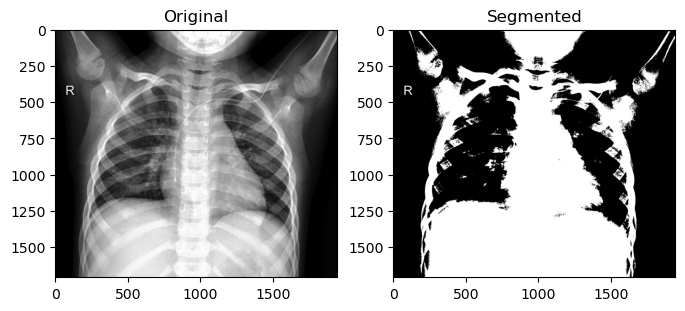

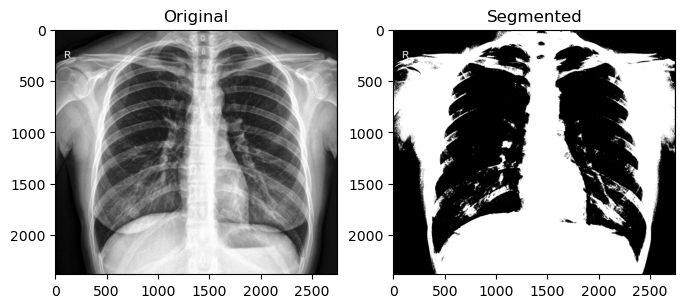

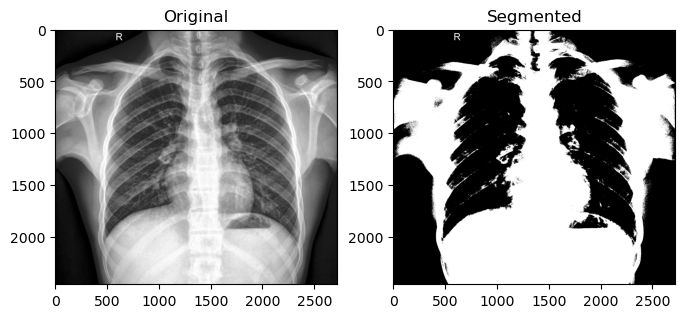

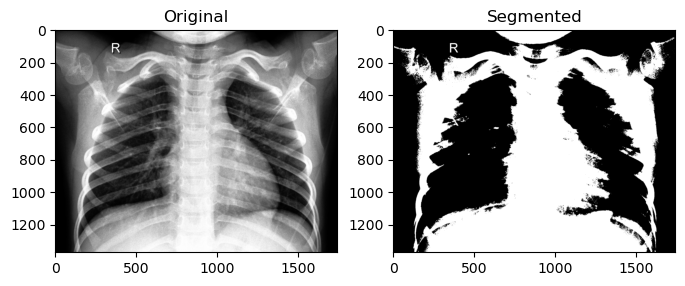

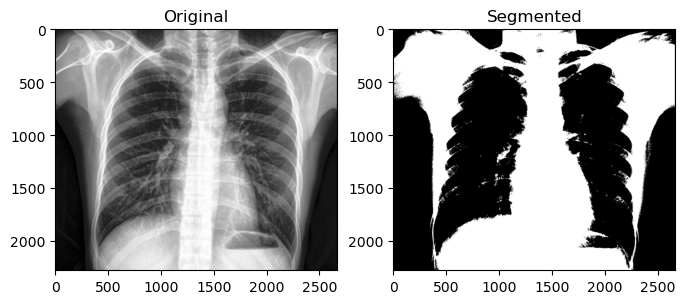

In [10]:
#GLOBAL THRESHOLDING
def segment_global_threshold(image, threshold_value):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, segmented_image = cv2.threshold(gray, threshold_value, 255, cv2.THRESH_BINARY)
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(segmented_image, cmap='gray'), plt.title('Segmented')
    plt.show()

# Set the threshold value
threshold_value = 127

# Segment the image using global thresholding
segment_global_threshold(image1, threshold_value)
segment_global_threshold(image2, threshold_value)
segment_global_threshold(image3, threshold_value)
segment_global_threshold(image4, threshold_value)
segment_global_threshold(image5, threshold_value)

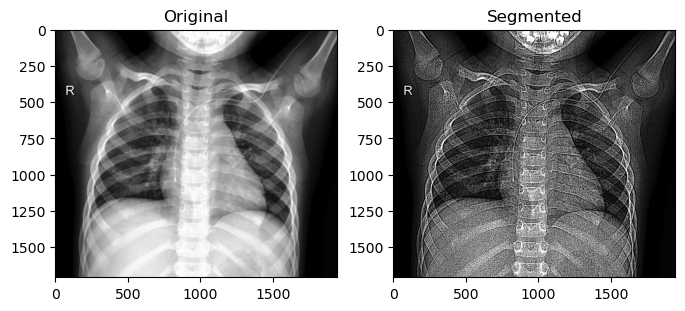

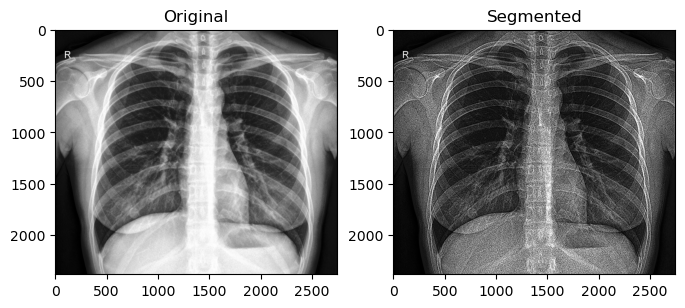

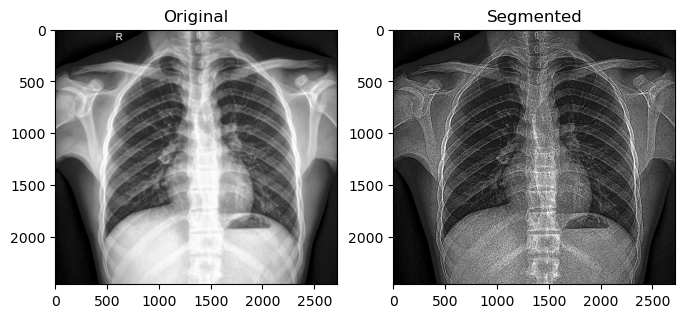

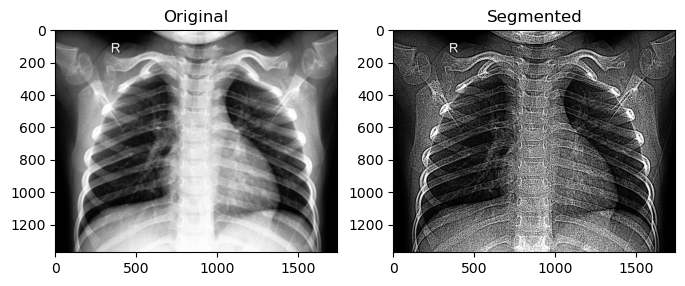

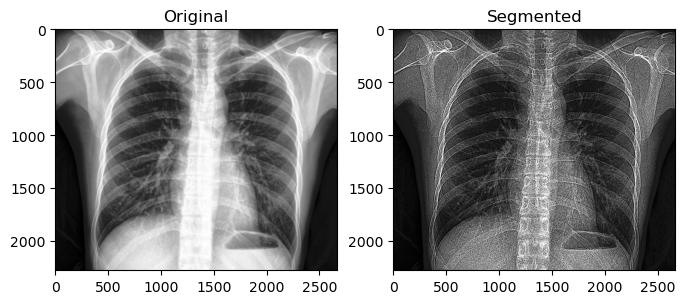

In [11]:
#ADAPTIVE THRESHOLDING

def segment_adaptive_threshold(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    threshold = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    segmented_image = cv2.bitwise_and(image, image, mask=threshold)
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(segmented_image, cmap='gray'), plt.title('Segmented')
    plt.show()

# Segment using adaptive thresholding
segment_adaptive_threshold(image1)
segment_adaptive_threshold(image2)
segment_adaptive_threshold(image3)
segment_adaptive_threshold(image4)
segment_adaptive_threshold(image5)

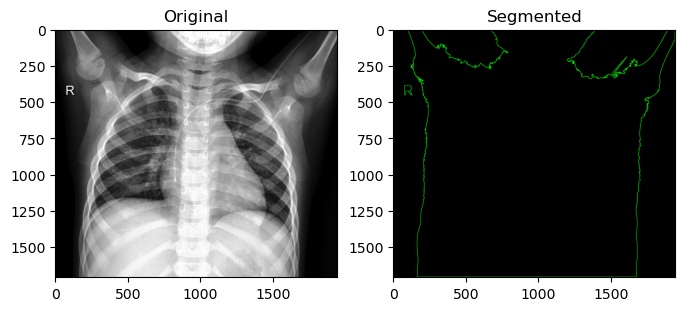

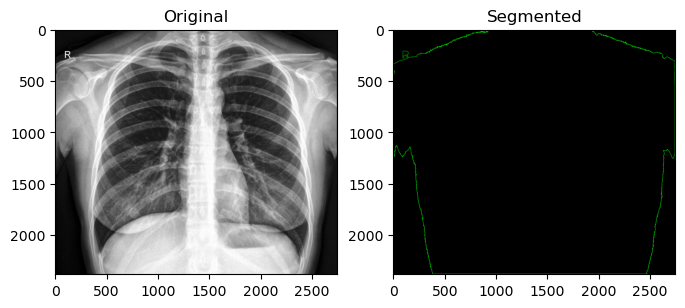

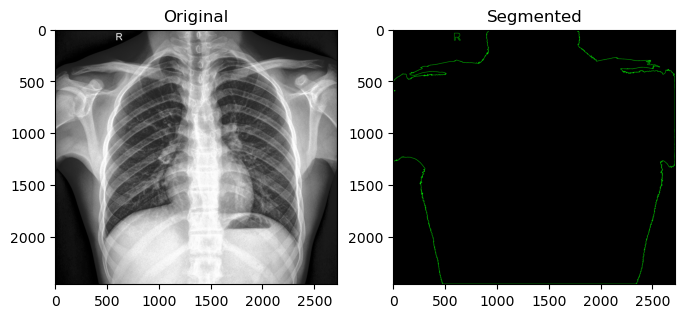

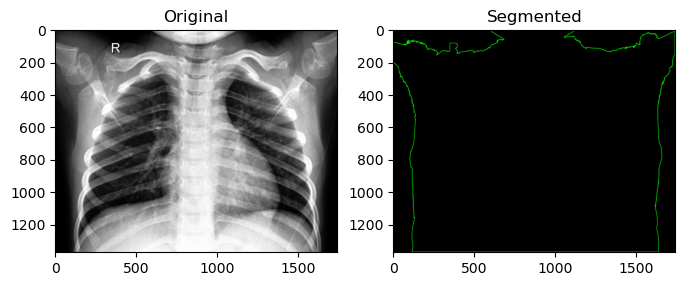

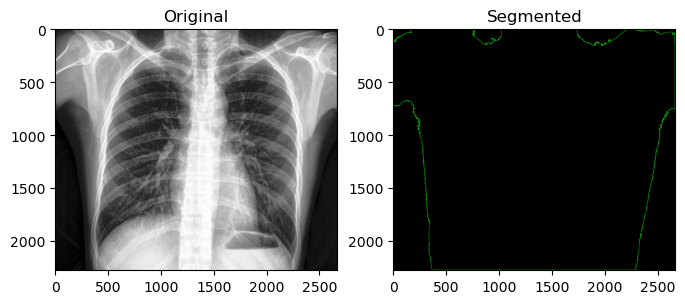

In [12]:
#CONTOURS BASED SEGMENTATION

def segment_contours(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, threshold = cv2.threshold(blurred, 70,70, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    segmented_image = np.zeros_like(image)

    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 1000:  # Adjust the area threshold as per your requirement
            cv2.drawContours(segmented_image, [contour], -1, (0, 255, 0), 2)
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(segmented_image, cmap='gray'), plt.title('Segmented')
    plt.show()

segment_contours(image1)
segment_contours(image2)
segment_contours(image3)
segment_contours(image4)
segment_contours(image5)

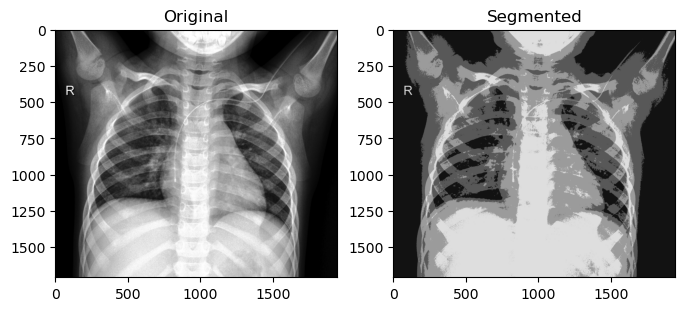

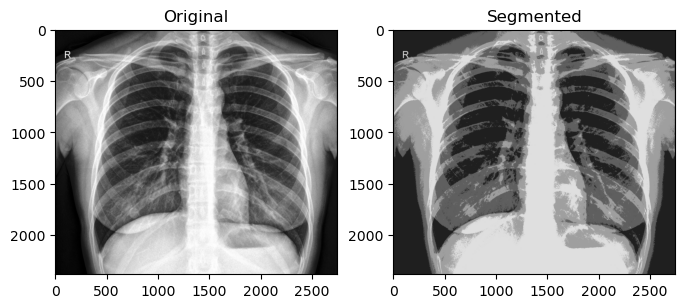

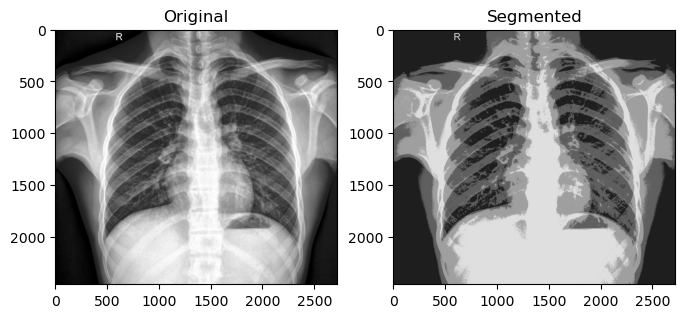

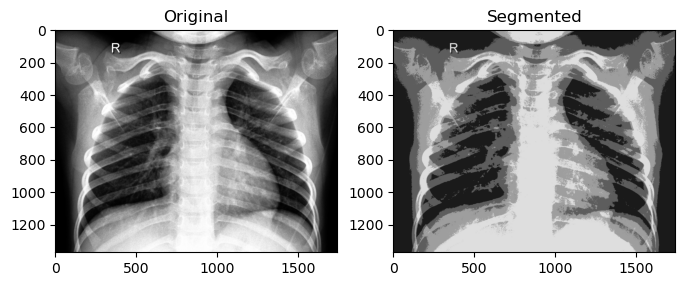

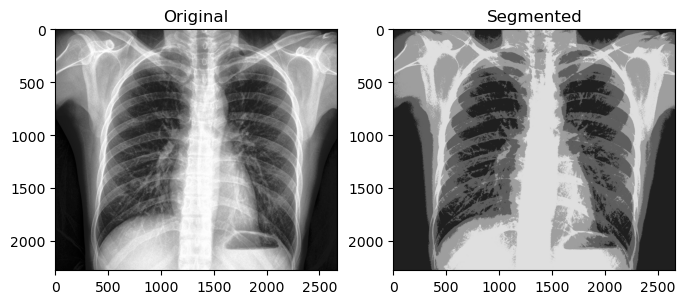

In [13]:
#REGION BASED SEGMENTATION

def segment_region_kmeans(image, k):
    # Reshape the image to a 2D array of pixels
    pixels = image.reshape(-1, 3).astype(np.float32)

    # Apply K-means clustering
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    _, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # Convert the centers to unsigned 8-bit integers
    centers = np.uint8(centers)

    # Map each pixel to its corresponding center
    segmented_image = centers[labels.flatten()]
    
    # Reshape the segmented image back to the original shape
    segmented_image = segmented_image.reshape(image.shape)

    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(segmented_image, cmap='gray'), plt.title('Segmented')
    plt.show()

# Segment using K-means clustering
k = 4  # Number of clusters
segment_region_kmeans(image1, k)
segment_region_kmeans(image2, k)
segment_region_kmeans(image3, k)
segment_region_kmeans(image4, k)
segment_region_kmeans(image5, k)

FEATURES COMPUTED

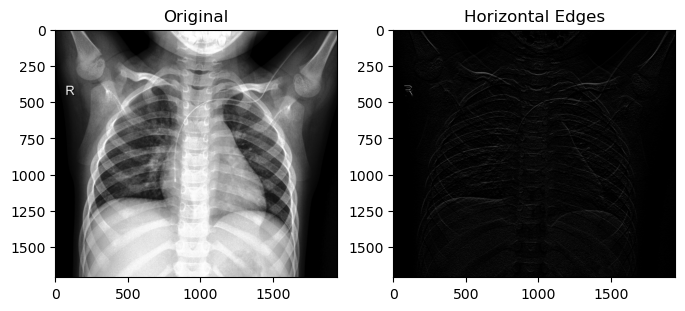

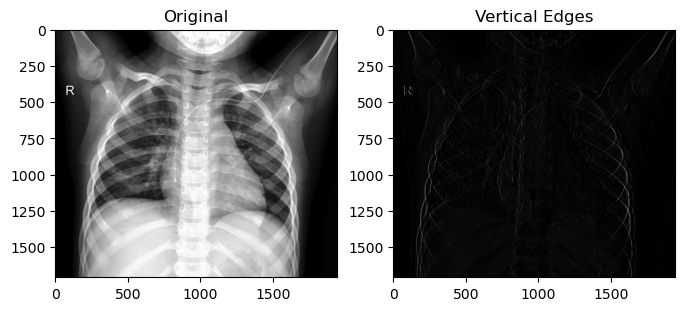

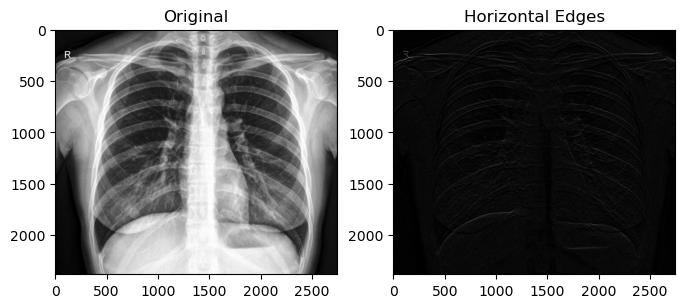

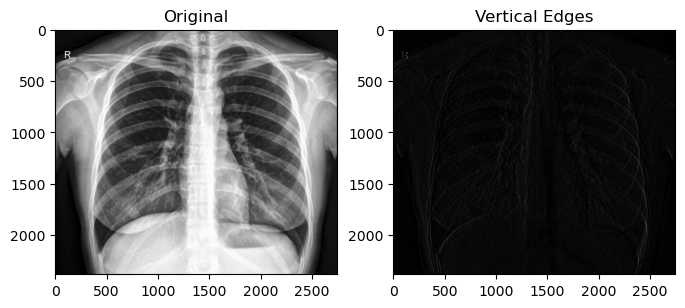

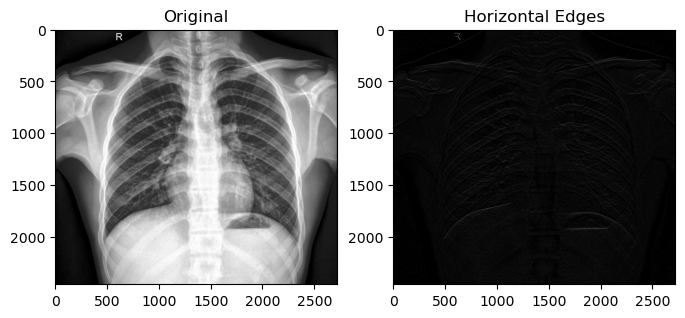

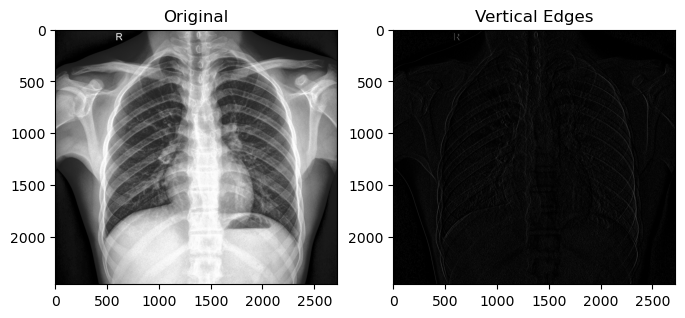

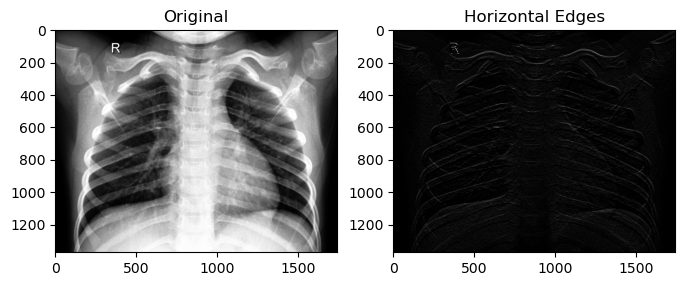

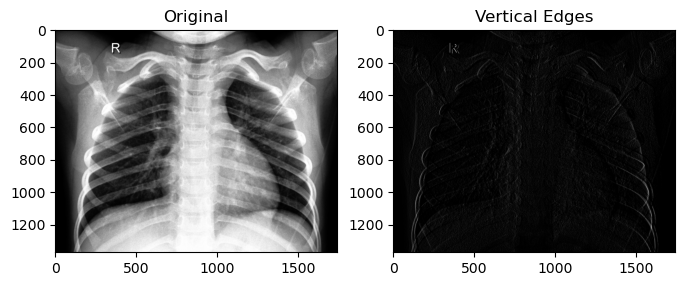

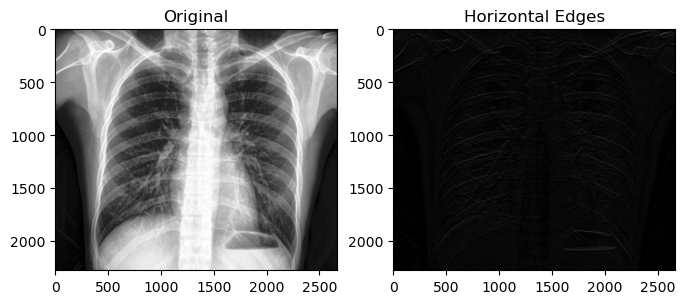

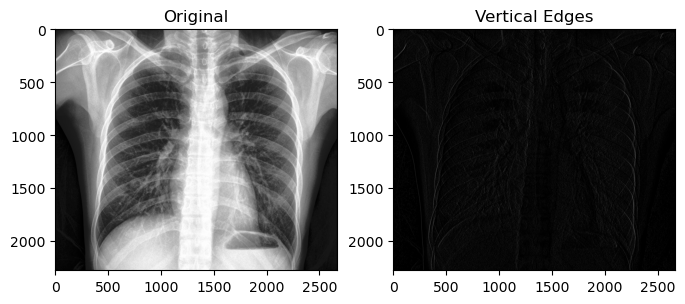

In [14]:
#PREWITT OPERATORS

def prewitt(image):

    kernel_x = np.array([[-1,-1,-1], [0,0,0],[1,1,1]])
    kernel_y = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])

    gradient_x = cv2.filter2D(image, -1, kernel_x)
    gradient_y = cv2.filter2D(image, -1, kernel_y)

    # Display the original image and the edges
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(gradient_x, cmap='gray'), plt.title('Horizontal Edges')
    plt.show()
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(gradient_y, cmap='gray'), plt.title('Vertical Edges')
    plt.show()

prewitt(image1)
prewitt(image2)
prewitt(image3)
prewitt(image4)
prewitt(image5)

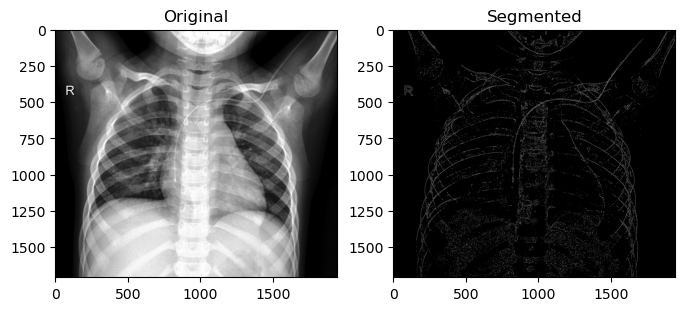

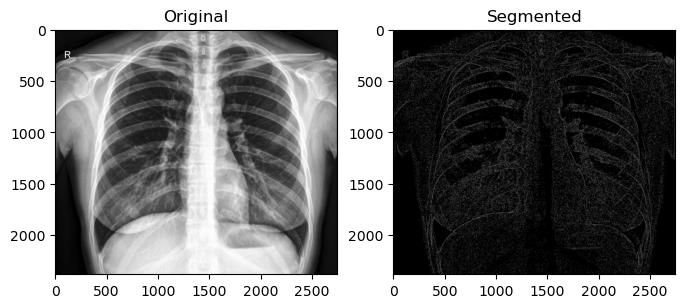

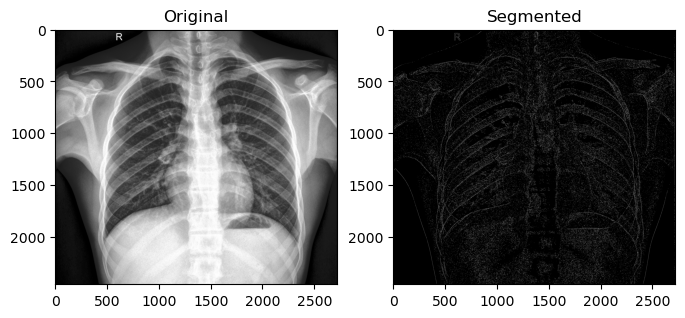

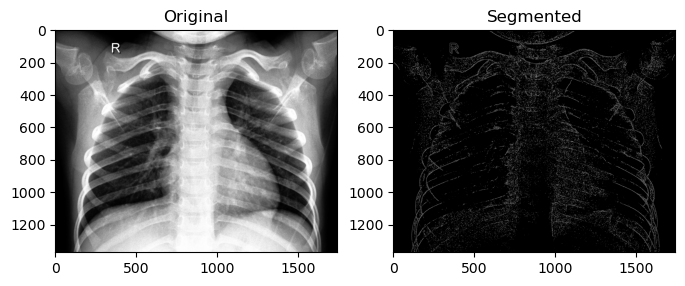

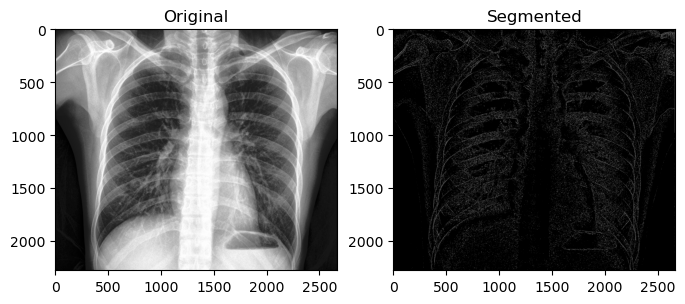

In [15]:
#CANNY EDGE  DETECTION

def segment_edges(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray,100, 100)  # Adjust the threshold values as needed

    # Create a black image with the same dimensions as the original image
    segmented_image = np.zeros_like(image)

    # Set the edges as white (255) in the segmented image
    segmented_image[edges != 0] = (255, 255, 255)
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(segmented_image, cmap='gray'), plt.title('Segmented')
    plt.show()
    
segment_edges(image1)
segment_edges(image2)
segment_edges(image3)
segment_edges(image4)
segment_edges(image5)

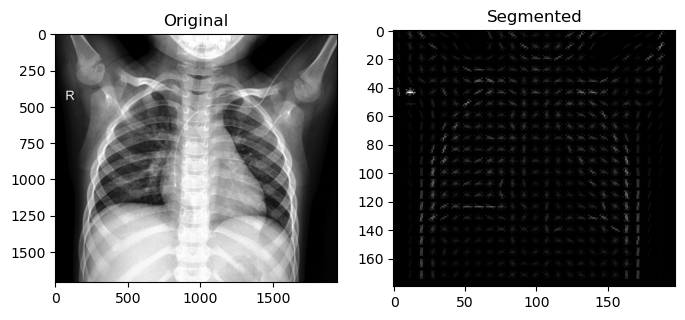

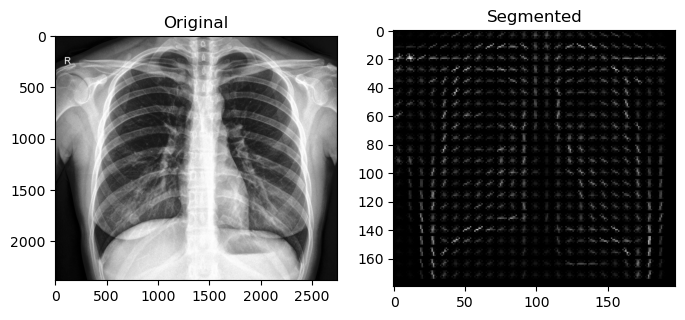

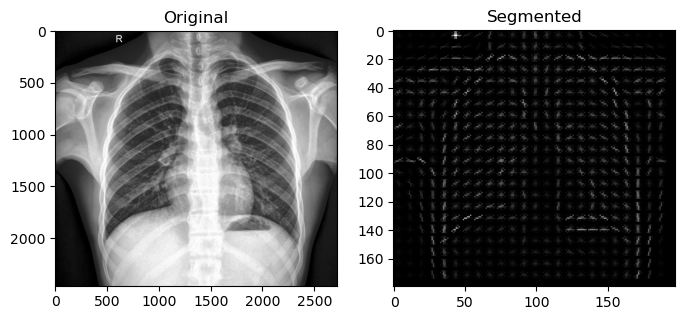

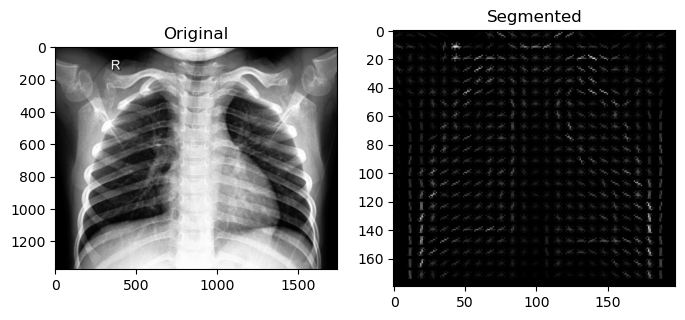

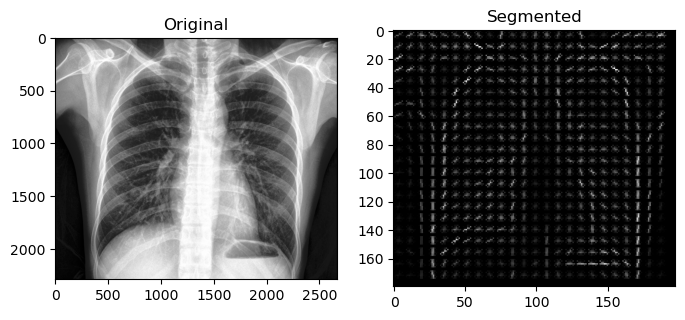

In [16]:
#HISTOGRAM ORIENTED GRADIENTS (HOG) 


def hog_features_image(image):
    imaget=image
    image = color.rgb2gray(image)

    # Resize image to a consistent size
    image = cv2.resize(image, (198, 180))
    # Calculate HOG features
    fd, hog_image = hog(image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

    # Rescale histogram for better visualization
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    # Display original and HOG image
    plt.figure(figsize=(8,4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(imaget, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(hog_image_rescaled, cmap='gray'), plt.title('Segmented')
    plt.show()

hog_features_image(image1)
hog_features_image(image2)
hog_features_image(image3)
hog_features_image(image4)
hog_features_image(image5)